#Frame Extraction

In [1]:
from google.colab import drive
import os
import cv2
from pathlib import Path

# Mount Google Drive
drive.mount('/content/drive')

# Paths
base_path = '/content/drive/MyDrive/student_version/data'
degraded_path = os.path.join(base_path, 'degraded_clips')
original_path = os.path.join(base_path, 'original_clips')
output_base = '/content/data'  # Local path to store extracted frames

# Frame extraction function
def extract_frames(video_path, output_dir, step=3):
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print(f"❌ Failed to open: {video_path}")
        return
    os.makedirs(output_dir, exist_ok=True)

    frame_idx = 0
    save_idx = 0
    while True:
        ret, frame = cap.read()
        if not ret:
            break
        if frame_idx % step == 0:
            frame_resized = cv2.resize(frame, (512, 512))
            filename = os.path.join(output_dir, f'frame_{save_idx:04d}.jpg')
            cv2.imwrite(filename, frame_resized)
            save_idx += 1
        frame_idx += 1
    cap.release()
    print(f"✅ {save_idx} frames saved to {output_dir}")

# Automatically extract frames from all .mp4 files in both folders
for mode, path in zip(['degraded_frames', 'original_frames'], [degraded_path, original_path]):
    video_files = sorted([f for f in os.listdir(path) if f.endswith('.mp4')])
    for video_file in video_files:
        name = Path(video_file).stem
        video_path = os.path.join(path, video_file)
        output_dir = os.path.join(output_base, mode, name)
        extract_frames(video_path, output_dir)

print("🎬 Frame extraction complete.")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ 600 frames saved to /content/data/degraded_frames/clip_0
✅ 600 frames saved to /content/data/degraded_frames/clip_1
✅ 600 frames saved to /content/data/degraded_frames/clip_2
✅ 600 frames saved to /content/data/degraded_frames/for_submission
✅ 600 frames saved to /content/data/original_frames/clip_0
✅ 600 frames saved to /content/data/original_frames/clip_1
✅ 600 frames saved to /content/data/original_frames/clip_2
🎬 Frame extraction complete.


#Create Train/Val Splits

In [2]:
import os
import shutil
from pathlib import Path
from sklearn.model_selection import train_test_split

def split_frames(input_dir, output_train_dir, output_val_dir, test_size=0.2):
    os.makedirs(output_train_dir, exist_ok=True)
    os.makedirs(output_val_dir, exist_ok=True)

    frames = sorted([f for f in os.listdir(input_dir) if f.endswith('.jpg')])
    train_frames, val_frames = train_test_split(frames, test_size=test_size, random_state=42)

    for f in train_frames:
        shutil.copy(os.path.join(input_dir, f), os.path.join(output_train_dir, f))
    for f in val_frames:
        shutil.copy(os.path.join(input_dir, f), os.path.join(output_val_dir, f))

# Loop over each clip
base_input = '/content/data'
for clip_id in ['clip_0', 'clip_1', 'clip_2']:
    degraded_input = os.path.join(base_input, 'degraded_frames', clip_id)
    original_input = os.path.join(base_input, 'original_frames', clip_id)

    split_frames(degraded_input, f"{base_input}/train/degraded", f"{base_input}/val/degraded")
    split_frames(original_input, f"{base_input}/train/original", f"{base_input}/val/original")


#Define Dataset + Loaders

In [3]:
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image

class PairedImageDataset(Dataset):
    def __init__(self, degraded_dir, original_dir, transform=None):
        self.degraded_dir = degraded_dir
        self.original_dir = original_dir
        self.transform = transform
        self.filenames = sorted(os.listdir(degraded_dir))

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        degraded_path = os.path.join(self.degraded_dir, self.filenames[idx])
        original_path = os.path.join(self.original_dir, self.filenames[idx])

        degraded = Image.open(degraded_path).convert("RGB")
        original = Image.open(original_path).convert("RGB")

        if self.transform:
            degraded = self.transform(degraded)
            original = self.transform(original)

        return degraded, original

transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

train_dataset = PairedImageDataset('/content/data/train/degraded', '/content/data/train/original', transform)
val_dataset = PairedImageDataset('/content/data/val/degraded', '/content/data/val/original', transform)


##U-Net Downsampling and Upsampling Blocks + GeneratorUNet

In [17]:
import torch
import torch.nn as nn

# Downsampling block
class UNetDown(nn.Module):
    def __init__(self, in_channels, out_channels, normalize=True, dropout=0.0):
        super().__init__()
        layers = [nn.Conv2d(in_channels, out_channels, 4, stride=2, padding=1)]
        if normalize:
            layers.append(nn.InstanceNorm2d(out_channels))
        layers.append(nn.LeakyReLU(0.2, inplace=True))
        if dropout:
            layers.append(nn.Dropout(dropout))
        self.block = nn.Sequential(*layers)

    def forward(self, x):
        return self.block(x)

# Upsampling block
class UNetUp(nn.Module):
    def __init__(self, in_channels, out_channels, dropout=0.0):
        super().__init__()
        self.upsample = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),  # 👈 smoother
            nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1),
            nn.InstanceNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
        self.dropout = nn.Dropout(dropout) if dropout else nn.Identity()

    def forward(self, x, skip_input):
        x = self.upsample(x)
        x = self.dropout(x)
        return torch.cat((x, skip_input), dim=1)


# Full U-Net Generator
class GeneratorUNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=3):
        super().__init__()

        # Encoder
        self.down1 = UNetDown(in_channels, 64, normalize=False)
        self.down2 = UNetDown(64, 128)
        self.down3 = UNetDown(128, 256)
        self.down4 = UNetDown(256, 512, dropout=0.5)
        self.down5 = UNetDown(512, 512, dropout=0.5)
        self.down6 = UNetDown(512, 512, dropout=0.5)
        self.down7 = UNetDown(512, 512, dropout=0.5)
        self.down8 = UNetDown(512, 512, normalize=False, dropout=0.5)

        # Decoder
        self.up1 = UNetUp(512, 512, dropout=0.5)
        self.up2 = UNetUp(1024, 512, dropout=0.5)
        self.up3 = UNetUp(1024, 512, dropout=0.5)
        self.up4 = UNetUp(1024, 512, dropout=0.5)
        self.up5 = UNetUp(1024, 256)
        self.up6 = UNetUp(512, 128)
        self.up7 = UNetUp(256, 64)

        self.final = nn.Sequential(
          nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),
          nn.Conv2d(128, out_channels, kernel_size=3, stride=1, padding=1),
          nn.Tanh()
        )


    def forward(self, x):
        # Encoding path
        d1 = self.down1(x)
        d2 = self.down2(d1)
        d3 = self.down3(d2)
        d4 = self.down4(d3)
        d5 = self.down5(d4)
        d6 = self.down6(d5)
        d7 = self.down7(d6)
        d8 = self.down8(d7)

        # Decoding path with skip connections
        u1 = self.up1(d8, d7)
        u2 = self.up2(u1, d6)
        u3 = self.up3(u2, d5)
        u4 = self.up4(u3, d4)
        u5 = self.up5(u4, d3)
        u6 = self.up6(u5, d2)
        u7 = self.up7(u6, d1)

        return self.final(u7)


##PatchGAN Discriminator

In [18]:
import torch
import torch.nn as nn

class Discriminator(nn.Module):
    def __init__(self, in_channels=3):
        super().__init__()

        def discriminator_block(in_feat, out_feat, normalize=True):
            layers = [nn.Conv2d(in_feat, out_feat, 4, stride=2, padding=1)]
            if normalize:
                layers.append(nn.InstanceNorm2d(out_feat))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
            *discriminator_block(in_channels * 2, 64, normalize=False),  # input is (degraded, real/restored)
            *discriminator_block(64, 128),
            *discriminator_block(128, 256),
            *discriminator_block(256, 512),
            nn.Conv2d(512, 1, 4, padding=1)  # Output PatchGAN feature map
        )

    def forward(self, img_A, img_B):
        # Concatenate images channel-wise: (degraded, restored/ground-truth)
        x = torch.cat((img_A, img_B), dim=1)

        # Add Gaussian noise during training only
        if self.training:
          noise = torch.randn_like(x) * 0.05  # stddev can be tuned
          x = x + noise

        return self.model(x)


##GAN Training Setup and Training Loop

In [19]:
import torch
import torch.nn as nn
import torch.optim as optim

# Instantiate models
generator = GeneratorUNet().to("cuda")
discriminator = Discriminator().to("cuda")

# Loss functions
criterion_GAN = nn.BCEWithLogitsLoss()  # PatchGAN loss
criterion_L1 = nn.L1Loss()              # Pixel-wise L1 loss

# Optimizers
optimizer_G = optim.Adam(generator.parameters(), lr=2e-4, betas=(0.5, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=2e-4, betas=(0.5, 0.999))


In [20]:
from torch.utils.data import DataLoader
from torchvision.utils import save_image
import os

# Setup
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=4)

sample_dir = "/content/samples"
os.makedirs(sample_dir, exist_ok=True)

num_epochs = 150

for epoch in range(num_epochs):
    generator.train()
    discriminator.train()

    for i, (degraded, original) in enumerate(train_loader):
        degraded = degraded.to("cuda")
        original = original.to("cuda")

        # --------------------
        #  Train Generator
        # --------------------
        optimizer_G.zero_grad()

        fake_output = generator(degraded)
        pred_fake = discriminator(degraded, fake_output)

        # Dynamically sized label tensors
        valid = torch.ones_like(pred_fake)
        loss_GAN = criterion_GAN(pred_fake, valid)
        loss_L1 = criterion_L1(fake_output, original)
        loss_G = loss_GAN + 50 * loss_L1
        loss_G.backward()
        optimizer_G.step()

        # ---------------------
        #  Train Discriminator
        # ---------------------
        optimizer_D.zero_grad()

        pred_real = discriminator(degraded, original)
        pred_fake_detached = discriminator(degraded, fake_output.detach())

        valid = torch.ones_like(pred_real) * 0.9
        fake = torch.zeros_like(pred_fake_detached) + 0.1

        loss_real = criterion_GAN(pred_real, valid)
        loss_fake = criterion_GAN(pred_fake_detached, fake)
        loss_D = 0.5 * (loss_real + loss_fake)
        loss_D.backward()
        optimizer_D.step()

        if i % 100 == 0:
            print(f"[Epoch {epoch}/{num_epochs}] [D loss: {loss_D.item():.4f}] [G loss: {loss_G.item():.4f}]")

    # ---------------------
    #  Save sample outputs
    # ---------------------
    generator.eval()
    with torch.no_grad():
        for degraded_val, _ in val_loader:
            degraded_val = degraded_val.to("cuda")
            restored_val = generator(degraded_val)
            sample = torch.cat((degraded_val, restored_val), dim=3)  # side-by-side
            save_image(sample.data, f"{sample_dir}/epoch_{epoch}.png", normalize=True)
            break  # Only save one batch per epoch


[Epoch 0/150] [Batch 0] [D loss: 0.7219] [G loss: 29.1971]
[Epoch 0/150] [Batch 100] [D loss: 0.5360] [G loss: 5.0130]
[Epoch 1/150] [Batch 0] [D loss: 0.5683] [G loss: 4.0401]
[Epoch 1/150] [Batch 100] [D loss: 0.8736] [G loss: 3.3994]
[Epoch 2/150] [Batch 0] [D loss: 0.4002] [G loss: 4.7170]
[Epoch 2/150] [Batch 100] [D loss: 0.5263] [G loss: 4.4226]
[Epoch 3/150] [Batch 0] [D loss: 0.6014] [G loss: 4.5405]
[Epoch 3/150] [Batch 100] [D loss: 0.4960] [G loss: 4.4027]
[Epoch 4/150] [Batch 0] [D loss: 0.8331] [G loss: 4.6698]
[Epoch 4/150] [Batch 100] [D loss: 0.4983] [G loss: 3.5211]
[Epoch 5/150] [Batch 0] [D loss: 0.4404] [G loss: 3.4783]
[Epoch 5/150] [Batch 100] [D loss: 0.6689] [G loss: 3.0575]
[Epoch 6/150] [Batch 0] [D loss: 0.6601] [G loss: 3.1433]
[Epoch 6/150] [Batch 100] [D loss: 0.5335] [G loss: 4.1475]
[Epoch 7/150] [Batch 0] [D loss: 0.4396] [G loss: 3.3774]
[Epoch 7/150] [Batch 100] [D loss: 0.6083] [G loss: 2.7882]
[Epoch 8/150] [Batch 0] [D loss: 0.6189] [G loss: 3.479

##Extract and Restore Frames

In [21]:
import os
import cv2
import torch
from torchvision.transforms.functional import to_tensor, normalize
from PIL import Image
from tqdm import tqdm

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Make sure generator is in eval mode
generator.eval()

# Input video path
submission_vid = '/content/drive/MyDrive/student_version/data/degraded_clips/for_submission.mp4'
cap = cv2.VideoCapture(submission_vid)

# Output folder for restored frames
submission_out_dir = '/content/restored_submission_frames'
os.makedirs(submission_out_dir, exist_ok=True)

frame_idx = 0
pbar = tqdm(total=int(cap.get(cv2.CAP_PROP_FRAME_COUNT)), desc="Restoring frames")

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    original_h, original_w = frame.shape[:2]

    # Resize for GAN
    frame_resized = cv2.resize(frame, (512, 512))
    img = Image.fromarray(cv2.cvtColor(frame_resized, cv2.COLOR_BGR2RGB))
    img_tensor = to_tensor(img).unsqueeze(0).to(device)
    img_tensor = normalize(img_tensor, [0.5]*3, [0.5]*3)

    # Restore frame using generator
    with torch.no_grad():
        restored = generator(img_tensor)
        restored = (restored * 0.5 + 0.5).clamp(0, 1)
        restored_img = restored.squeeze().cpu().permute(1, 2, 0).numpy() * 255
        restored_img = restored_img.astype('uint8')

    # Resize back to original resolution
    restored_img = cv2.resize(restored_img, (original_w, original_h), interpolation=cv2.INTER_CUBIC)

    # Save restored frame
    out_path = os.path.join(submission_out_dir, f"frame_{frame_idx:04d}.png")
    cv2.imwrite(out_path, cv2.cvtColor(restored_img, cv2.COLOR_RGB2BGR))
    frame_idx += 1
    pbar.update(1)

cap.release()
pbar.close()
print(f"✅ Restored {frame_idx} frames from for_submission.mp4")


Restoring frames: 100%|██████████| 1800/1800 [03:13<00:00,  9.32it/s]

✅ Restored 1800 frames from for_submission.mp4


##Combine Restored Frames into Video

In [22]:
import cv2
import os
from glob import glob
from natsort import natsorted

# Output video path
video_out = '/content/restored_submission.mp4'
frame_dir = '/content/restored_submission_frames'
fps = 60  # Set to match original video

# Load and sort frames
frame_paths = natsorted(glob(os.path.join(frame_dir, '*.png')))
frame_example = cv2.imread(frame_paths[0])
h, w, _ = frame_example.shape

# Define VideoWriter
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
video_writer = cv2.VideoWriter(video_out, fourcc, fps, (w, h))

for path in frame_paths:
    frame = cv2.imread(path)
    video_writer.write(frame)

video_writer.release()
print(f"🎥 Restored video saved at: {video_out}")


🎥 Restored video saved at: /content/restored_submission.mp4


In [28]:
# Zip /content/data
!zip -r /content/data.zip /content/data/

# Zip restored frames
!zip -r /content/restored_submission_frames.zip /content/restored_submission_frames/

!zip -r /content/segmentation_masks.zip /content/segmentation_masks/
!zip -r /content/detected_boxes.zip /content/detected_boxes/


Streaming output truncated to the last 5000 lines.
  adding: content/data/degraded_frames/for_submission/frame_0416.jpg (deflated 0%)
  adding: content/data/degraded_frames/for_submission/frame_0166.jpg (deflated 0%)
  adding: content/data/degraded_frames/for_submission/frame_0351.jpg (deflated 0%)
  adding: content/data/degraded_frames/for_submission/frame_0251.jpg (deflated 0%)
  adding: content/data/degraded_frames/for_submission/frame_0414.jpg (deflated 0%)
  adding: content/data/degraded_frames/for_submission/frame_0506.jpg (deflated 0%)
  adding: content/data/degraded_frames/for_submission/frame_0557.jpg (deflated 0%)
  adding: content/data/degraded_frames/for_submission/frame_0564.jpg (deflated 0%)
  adding: content/data/degraded_frames/for_submission/frame_0479.jpg (deflated 0%)
  adding: content/data/degraded_frames/for_submission/frame_0113.jpg (deflated 0%)
  adding: content/data/degraded_frames/for_submission/frame_0362.jpg (deflated 0%)
  adding: content/data/degraded_fram

In [29]:
from google.colab import files

# Download zip files
files.download('/content/data.zip')
files.download('/content/restored_submission_frames.zip')
files.download('/content/segmentation_masks.zip')
files.download('/content/detected_boxes.zip')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#Detect & Track People and Vehicles in Restored Video

- Install & load YOLOv8

- Run yolo track on restored_for_submission.mp4

- Automatically save:

    - Bounded + segmented video

    - IDs for each object

    - Optionally extract crops and masks per ID

In [23]:
!pip install ultralytics --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 19.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 117.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 101.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 58.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 43.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 20.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 108.0 MB/s eta 0:00:00


In [24]:
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


##Run YOLOv8 Tracking with Segmentation

In [39]:
!rm -rf runs/segment/track
!rm -rf /content/archival_output_masks_fixed


# ***Where did YOLO struggle to identify and track people / cars? What characteristics of the objects do you think caused this?***

YOLO sometimes misclassified cars as buses or trucks. This likely occurred due to the low-resolution, grayscale nature of the historical footage, where features like color, branding, and modern shape cues are missing. The COCO-trained YOLOv8 model relies heavily on visual and spatial cues learned from modern, high-resolution images, leading to confusion when distinguishing between large vehicles like sedans, buses, and trucks in degraded or old footage.

# ***What are some techniques / enhancements you would consider to improve the restoration process?***

To improve the restoration process, I would consider training the GAN on higher-resolution frames (e.g., 512×512 or 768×768) to preserve fine details and reduce upscaling artifacts. Replacing transposed convolutions with smoother upsampling techniques like bilinear upsampling followed by convolution can help eliminate checkerboard patterns. Incorporating perceptual loss (e.g., VGG-based) alongside L1 loss can encourage the generator to produce outputs that are perceptually closer to real images.


CUDA available: True
CUDA device: NVIDIA A100-SXM4-40GB
Video dimensions: 1440x1080, FPS: 60.0, Total frames: 1800

video 1/1 (frame 1/1800) /content/restored_submission.mp4: 480x640 3 persons, 15.1ms
video 1/1 (frame 2/1800) /content/restored_submission.mp4: 480x640 3 persons, 13.9ms
video 1/1 (frame 3/1800) /content/restored_submission.mp4: 480x640 3 persons, 13.4ms
video 1/1 (frame 4/1800) /content/restored_submission.mp4: 480x640 3 persons, 13.4ms
video 1/1 (frame 5/1800) /content/restored_submission.mp4: 480x640 3 persons, 13.5ms
video 1/1 (frame 6/1800) /content/restored_submission.mp4: 480x640 3 persons, 13.4ms
video 1/1 (frame 7/1800) /content/restored_submission.mp4: 480x640 3 persons, 13.3ms
video 1/1 (frame 8/1800) /content/restored_submission.mp4: 480x640 3 persons, 13.5ms
video 1/1 (frame 9/1800) /content/restored_submission.mp4: 480x640 3 persons, 13.3ms
video 1/1 (frame 10/1800) /content/restored_submission.mp4: 480x640 3 persons, 13.4ms
video 1/1 (frame 11/1800) /conten

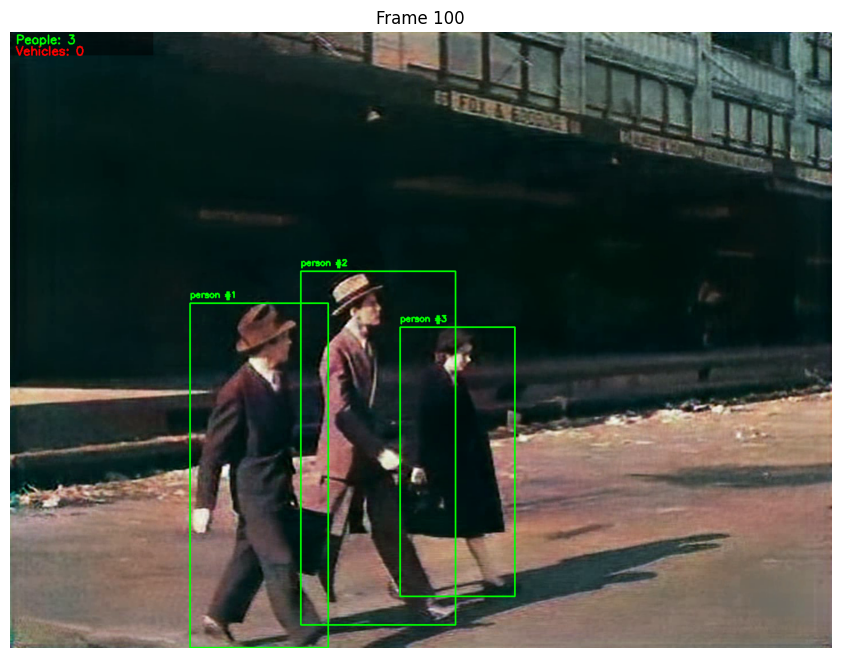

video 1/1 (frame 101/1800) /content/restored_submission.mp4: 480x640 3 persons, 14.2ms
video 1/1 (frame 102/1800) /content/restored_submission.mp4: 480x640 3 persons, 14.1ms
video 1/1 (frame 103/1800) /content/restored_submission.mp4: 480x640 3 persons, 13.5ms
video 1/1 (frame 104/1800) /content/restored_submission.mp4: 480x640 3 persons, 13.5ms
video 1/1 (frame 105/1800) /content/restored_submission.mp4: 480x640 3 persons, 13.5ms
video 1/1 (frame 106/1800) /content/restored_submission.mp4: 480x640 3 persons, 13.5ms
video 1/1 (frame 107/1800) /content/restored_submission.mp4: 480x640 3 persons, 14.2ms
video 1/1 (frame 108/1800) /content/restored_submission.mp4: 480x640 3 persons, 13.4ms
video 1/1 (frame 109/1800) /content/restored_submission.mp4: 480x640 3 persons, 13.7ms
video 1/1 (frame 110/1800) /content/restored_submission.mp4: 480x640 3 persons, 13.5ms
video 1/1 (frame 111/1800) /content/restored_submission.mp4: 480x640 3 persons, 13.7ms
video 1/1 (frame 112/1800) /content/restore

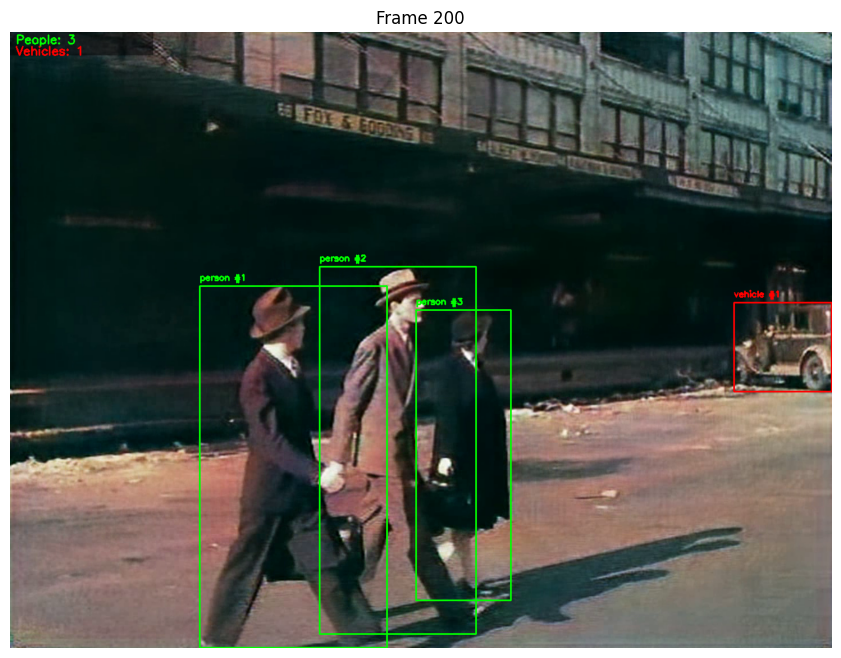

video 1/1 (frame 201/1800) /content/restored_submission.mp4: 480x640 3 persons, 1 car, 14.1ms
video 1/1 (frame 202/1800) /content/restored_submission.mp4: 480x640 3 persons, 1 car, 13.5ms
video 1/1 (frame 203/1800) /content/restored_submission.mp4: 480x640 3 persons, 1 car, 13.5ms
video 1/1 (frame 204/1800) /content/restored_submission.mp4: 480x640 3 persons, 1 truck, 13.4ms
video 1/1 (frame 205/1800) /content/restored_submission.mp4: 480x640 3 persons, 1 truck, 13.9ms
video 1/1 (frame 206/1800) /content/restored_submission.mp4: 480x640 3 persons, 1 truck, 13.5ms
video 1/1 (frame 207/1800) /content/restored_submission.mp4: 480x640 3 persons, 1 truck, 13.6ms
video 1/1 (frame 208/1800) /content/restored_submission.mp4: 480x640 3 persons, 1 truck, 13.5ms
video 1/1 (frame 209/1800) /content/restored_submission.mp4: 480x640 4 persons, 13.9ms
video 1/1 (frame 210/1800) /content/restored_submission.mp4: 480x640 3 persons, 13.9ms
video 1/1 (frame 211/1800) /content/restored_submission.mp4: 480

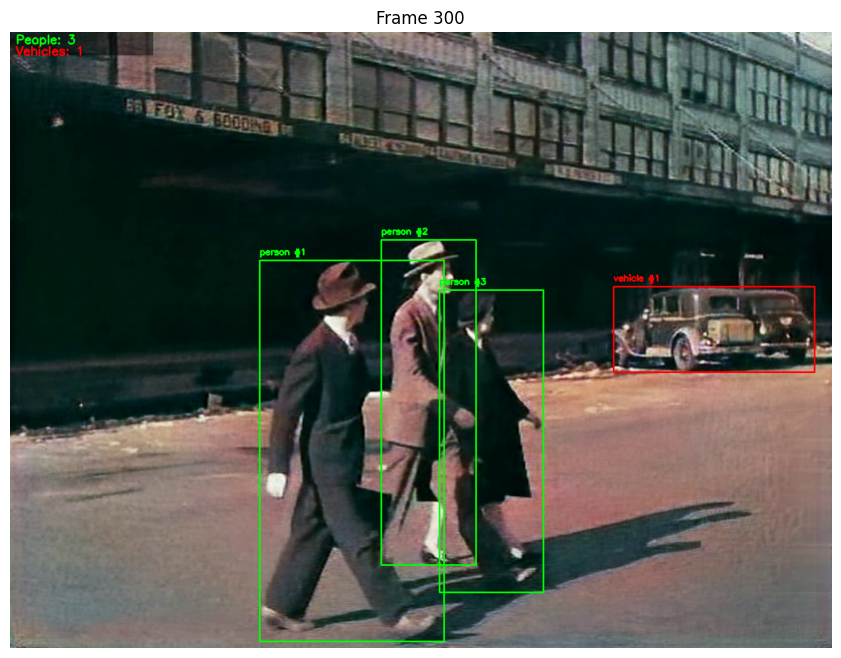

video 1/1 (frame 301/1800) /content/restored_submission.mp4: 480x640 3 persons, 1 car, 14.1ms
video 1/1 (frame 302/1800) /content/restored_submission.mp4: 480x640 3 persons, 2 cars, 14.0ms
video 1/1 (frame 303/1800) /content/restored_submission.mp4: 480x640 3 persons, 1 car, 13.5ms
video 1/1 (frame 304/1800) /content/restored_submission.mp4: 480x640 3 persons, 2 cars, 13.6ms
video 1/1 (frame 305/1800) /content/restored_submission.mp4: 480x640 3 persons, 1 car, 13.4ms
video 1/1 (frame 306/1800) /content/restored_submission.mp4: 480x640 3 persons, 1 car, 13.5ms
video 1/1 (frame 307/1800) /content/restored_submission.mp4: 480x640 3 persons, 2 cars, 13.8ms
video 1/1 (frame 308/1800) /content/restored_submission.mp4: 480x640 3 persons, 1 car, 13.5ms
video 1/1 (frame 309/1800) /content/restored_submission.mp4: 480x640 3 persons, 2 cars, 14.0ms
video 1/1 (frame 310/1800) /content/restored_submission.mp4: 480x640 3 persons, 1 car, 13.7ms
video 1/1 (frame 311/1800) /content/restored_submission.

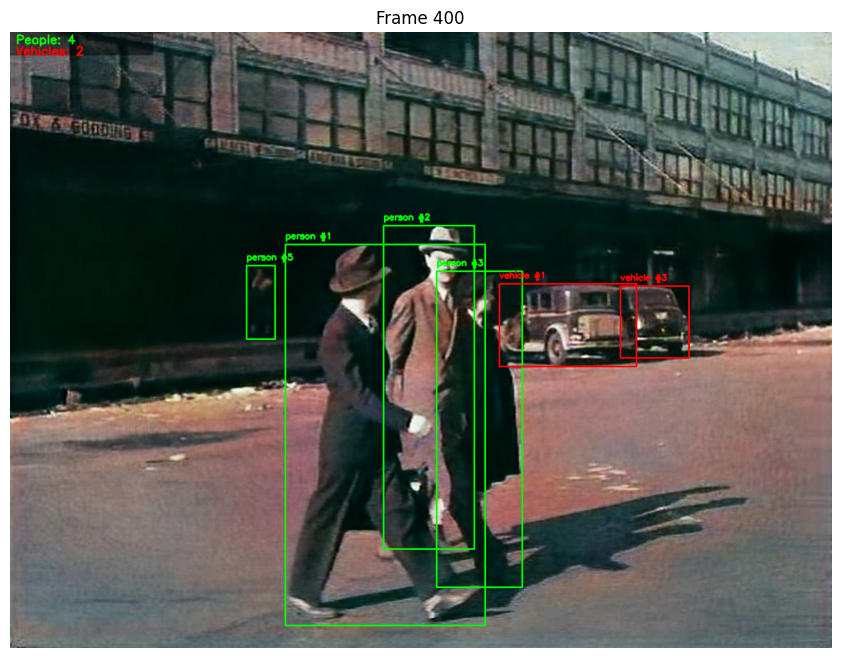

video 1/1 (frame 401/1800) /content/restored_submission.mp4: 480x640 3 persons, 2 cars, 16.3ms
video 1/1 (frame 402/1800) /content/restored_submission.mp4: 480x640 4 persons, 2 cars, 15.2ms
video 1/1 (frame 403/1800) /content/restored_submission.mp4: 480x640 3 persons, 2 cars, 13.8ms
video 1/1 (frame 404/1800) /content/restored_submission.mp4: 480x640 3 persons, 2 cars, 13.7ms
video 1/1 (frame 405/1800) /content/restored_submission.mp4: 480x640 3 persons, 2 cars, 13.5ms
video 1/1 (frame 406/1800) /content/restored_submission.mp4: 480x640 3 persons, 2 cars, 13.9ms
video 1/1 (frame 407/1800) /content/restored_submission.mp4: 480x640 4 persons, 2 cars, 13.9ms
video 1/1 (frame 408/1800) /content/restored_submission.mp4: 480x640 3 persons, 2 cars, 13.6ms
video 1/1 (frame 409/1800) /content/restored_submission.mp4: 480x640 3 persons, 2 cars, 13.7ms
video 1/1 (frame 410/1800) /content/restored_submission.mp4: 480x640 3 persons, 2 cars, 13.4ms
video 1/1 (frame 411/1800) /content/restored_submi

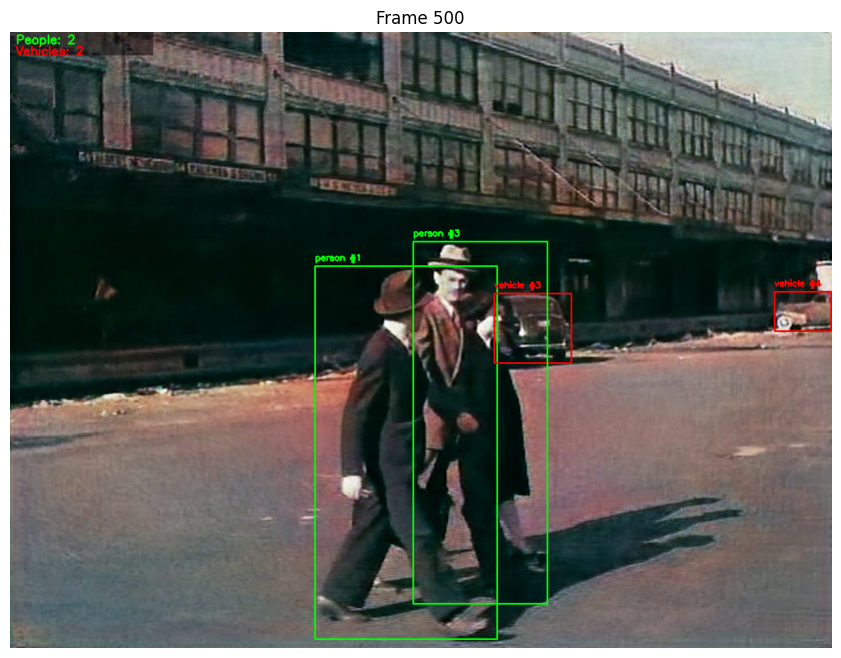

video 1/1 (frame 501/1800) /content/restored_submission.mp4: 480x640 2 persons, 1 car, 1 truck, 13.8ms
video 1/1 (frame 502/1800) /content/restored_submission.mp4: 480x640 2 persons, 2 cars, 13.5ms
video 1/1 (frame 503/1800) /content/restored_submission.mp4: 480x640 2 persons, 2 cars, 13.9ms
video 1/1 (frame 504/1800) /content/restored_submission.mp4: 480x640 2 persons, 2 cars, 13.7ms
video 1/1 (frame 505/1800) /content/restored_submission.mp4: 480x640 2 persons, 2 cars, 13.7ms
video 1/1 (frame 506/1800) /content/restored_submission.mp4: 480x640 2 persons, 2 cars, 13.7ms
video 1/1 (frame 507/1800) /content/restored_submission.mp4: 480x640 2 persons, 1 car, 1 truck, 14.0ms
video 1/1 (frame 508/1800) /content/restored_submission.mp4: 480x640 3 persons, 2 cars, 13.8ms
video 1/1 (frame 509/1800) /content/restored_submission.mp4: 480x640 2 persons, 2 cars, 14.2ms
video 1/1 (frame 510/1800) /content/restored_submission.mp4: 480x640 2 persons, 1 car, 13.7ms
video 1/1 (frame 511/1800) /content

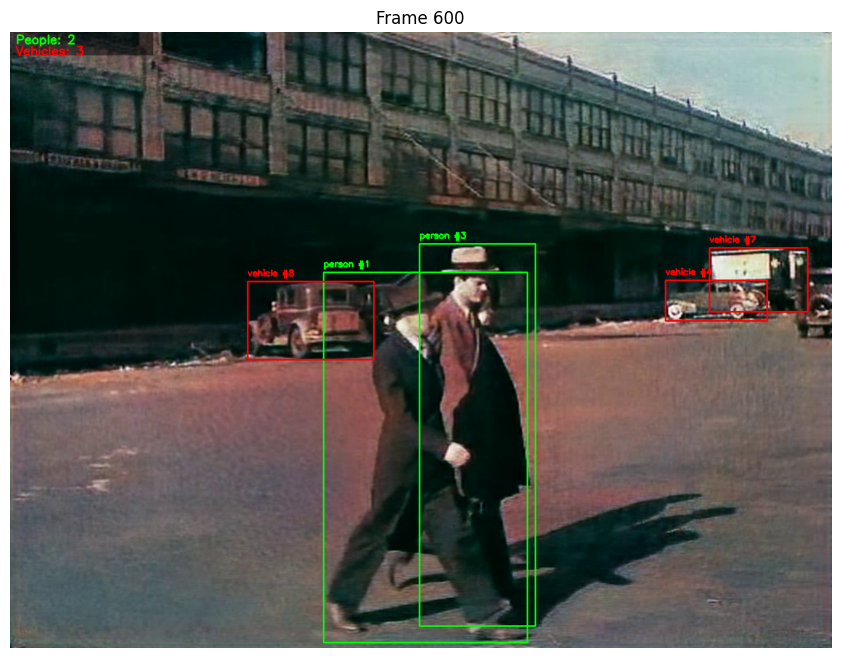

video 1/1 (frame 601/1800) /content/restored_submission.mp4: 480x640 2 persons, 2 cars, 1 truck, 15.9ms
video 1/1 (frame 602/1800) /content/restored_submission.mp4: 480x640 2 persons, 2 cars, 1 truck, 14.1ms
video 1/1 (frame 603/1800) /content/restored_submission.mp4: 480x640 2 persons, 2 cars, 1 truck, 13.8ms
video 1/1 (frame 604/1800) /content/restored_submission.mp4: 480x640 2 persons, 2 cars, 2 trucks, 14.1ms
video 1/1 (frame 605/1800) /content/restored_submission.mp4: 480x640 2 persons, 3 cars, 1 truck, 13.9ms
video 1/1 (frame 606/1800) /content/restored_submission.mp4: 480x640 2 persons, 3 cars, 1 truck, 13.8ms
video 1/1 (frame 607/1800) /content/restored_submission.mp4: 480x640 2 persons, 2 cars, 2 trucks, 13.9ms
video 1/1 (frame 608/1800) /content/restored_submission.mp4: 480x640 2 persons, 3 cars, 1 truck, 14.1ms
video 1/1 (frame 609/1800) /content/restored_submission.mp4: 480x640 2 persons, 2 cars, 1 truck, 14.0ms
video 1/1 (frame 610/1800) /content/restored_submission.mp4: 4

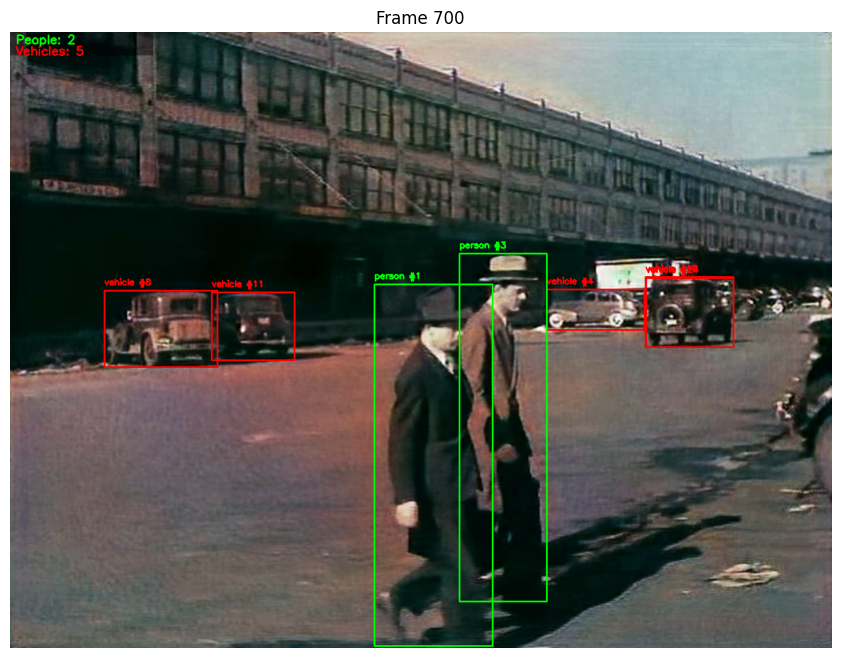

video 1/1 (frame 701/1800) /content/restored_submission.mp4: 480x640 2 persons, 3 cars, 13.9ms
video 1/1 (frame 702/1800) /content/restored_submission.mp4: 480x640 2 persons, 3 cars, 1 truck, 13.9ms
video 1/1 (frame 703/1800) /content/restored_submission.mp4: 480x640 2 persons, 3 cars, 2 trucks, 14.1ms
video 1/1 (frame 704/1800) /content/restored_submission.mp4: 480x640 2 persons, 3 cars, 2 trucks, 14.2ms
video 1/1 (frame 705/1800) /content/restored_submission.mp4: 480x640 2 persons, 3 cars, 2 trucks, 13.8ms
video 1/1 (frame 706/1800) /content/restored_submission.mp4: 480x640 2 persons, 3 cars, 2 trucks, 15.7ms
video 1/1 (frame 707/1800) /content/restored_submission.mp4: 480x640 2 persons, 3 cars, 2 trucks, 13.8ms
video 1/1 (frame 708/1800) /content/restored_submission.mp4: 480x640 2 persons, 3 cars, 2 trucks, 13.9ms
video 1/1 (frame 709/1800) /content/restored_submission.mp4: 480x640 2 persons, 3 cars, 3 trucks, 14.6ms
video 1/1 (frame 710/1800) /content/restored_submission.mp4: 480x6

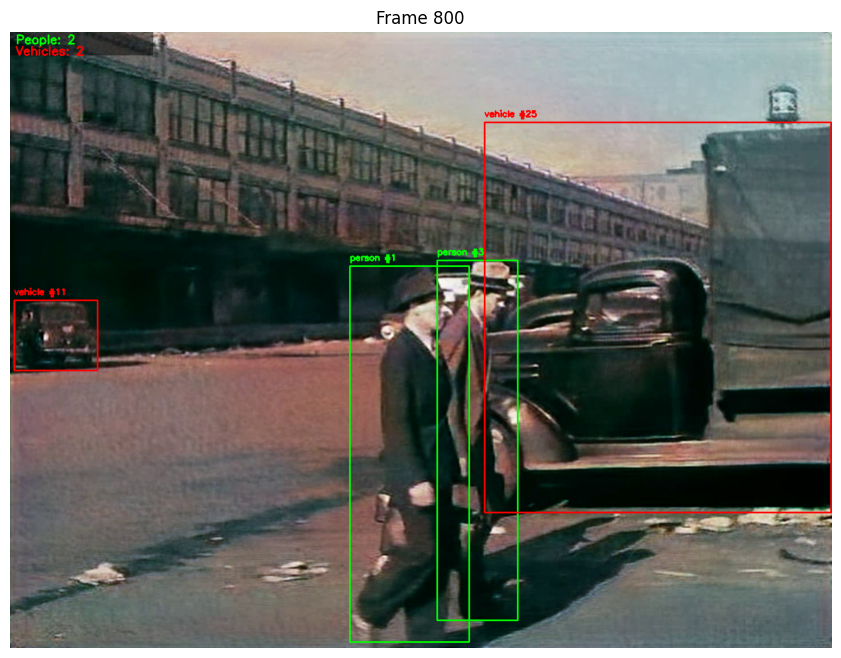

video 1/1 (frame 801/1800) /content/restored_submission.mp4: 480x640 2 persons, 1 car, 1 truck, 13.5ms
video 1/1 (frame 802/1800) /content/restored_submission.mp4: 480x640 2 persons, 1 car, 1 truck, 13.5ms
video 1/1 (frame 803/1800) /content/restored_submission.mp4: 480x640 2 persons, 1 car, 1 truck, 13.3ms
video 1/1 (frame 804/1800) /content/restored_submission.mp4: 480x640 2 persons, 1 car, 1 truck, 13.3ms
video 1/1 (frame 805/1800) /content/restored_submission.mp4: 480x640 2 persons, 1 car, 13.4ms
video 1/1 (frame 806/1800) /content/restored_submission.mp4: 480x640 2 persons, 1 car, 1 truck, 13.9ms
video 1/1 (frame 807/1800) /content/restored_submission.mp4: 480x640 2 persons, 1 car, 1 truck, 14.2ms
video 1/1 (frame 808/1800) /content/restored_submission.mp4: 480x640 2 persons, 1 car, 1 truck, 13.7ms
video 1/1 (frame 809/1800) /content/restored_submission.mp4: 480x640 2 persons, 1 car, 2 trucks, 15.3ms
video 1/1 (frame 810/1800) /content/restored_submission.mp4: 480x640 2 persons, 2

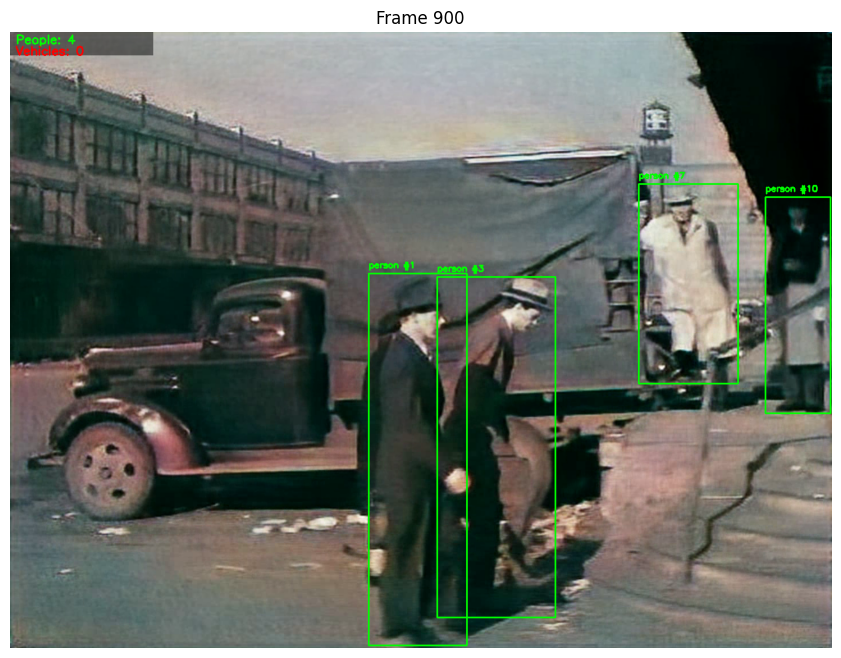

video 1/1 (frame 901/1800) /content/restored_submission.mp4: 480x640 4 persons, 1 truck, 18.8ms
video 1/1 (frame 902/1800) /content/restored_submission.mp4: 480x640 4 persons, 14.1ms
video 1/1 (frame 903/1800) /content/restored_submission.mp4: 480x640 4 persons, 1 truck, 13.7ms
video 1/1 (frame 904/1800) /content/restored_submission.mp4: 480x640 4 persons, 1 truck, 13.5ms
video 1/1 (frame 905/1800) /content/restored_submission.mp4: 480x640 4 persons, 1 truck, 17.2ms
video 1/1 (frame 906/1800) /content/restored_submission.mp4: 480x640 4 persons, 1 truck, 13.8ms
video 1/1 (frame 907/1800) /content/restored_submission.mp4: 480x640 4 persons, 1 truck, 13.5ms
video 1/1 (frame 908/1800) /content/restored_submission.mp4: 480x640 4 persons, 1 truck, 14.0ms
video 1/1 (frame 909/1800) /content/restored_submission.mp4: 480x640 4 persons, 13.7ms
video 1/1 (frame 910/1800) /content/restored_submission.mp4: 480x640 4 persons, 13.7ms
video 1/1 (frame 911/1800) /content/restored_submission.mp4: 480x64

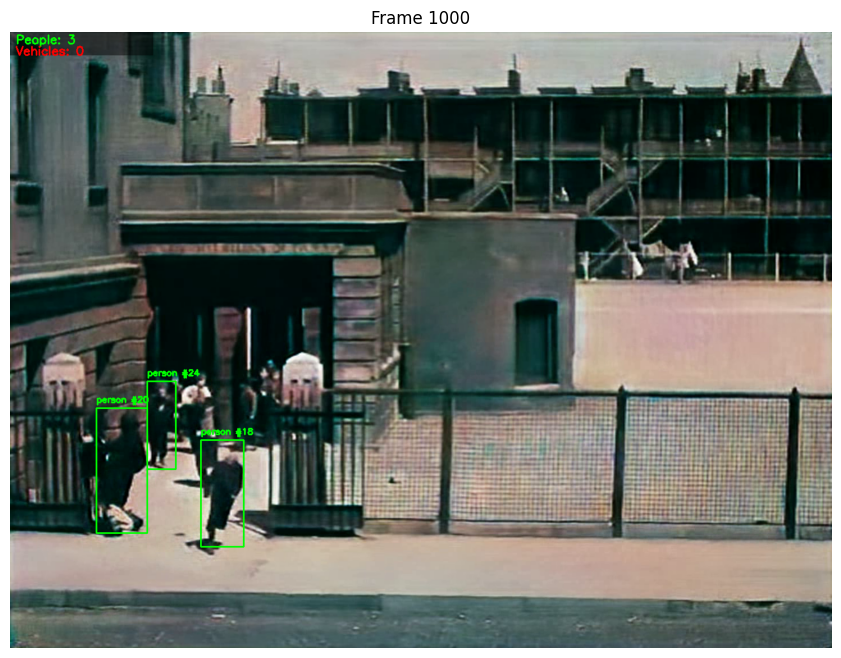

video 1/1 (frame 1001/1800) /content/restored_submission.mp4: 480x640 3 persons, 13.5ms
video 1/1 (frame 1002/1800) /content/restored_submission.mp4: 480x640 4 persons, 13.5ms
video 1/1 (frame 1003/1800) /content/restored_submission.mp4: 480x640 4 persons, 13.4ms
video 1/1 (frame 1004/1800) /content/restored_submission.mp4: 480x640 4 persons, 13.4ms
video 1/1 (frame 1005/1800) /content/restored_submission.mp4: 480x640 4 persons, 13.5ms
video 1/1 (frame 1006/1800) /content/restored_submission.mp4: 480x640 4 persons, 14.0ms
video 1/1 (frame 1007/1800) /content/restored_submission.mp4: 480x640 4 persons, 13.8ms
video 1/1 (frame 1008/1800) /content/restored_submission.mp4: 480x640 4 persons, 13.8ms
video 1/1 (frame 1009/1800) /content/restored_submission.mp4: 480x640 5 persons, 14.0ms
video 1/1 (frame 1010/1800) /content/restored_submission.mp4: 480x640 5 persons, 14.0ms
video 1/1 (frame 1011/1800) /content/restored_submission.mp4: 480x640 6 persons, 13.8ms
video 1/1 (frame 1012/1800) /con

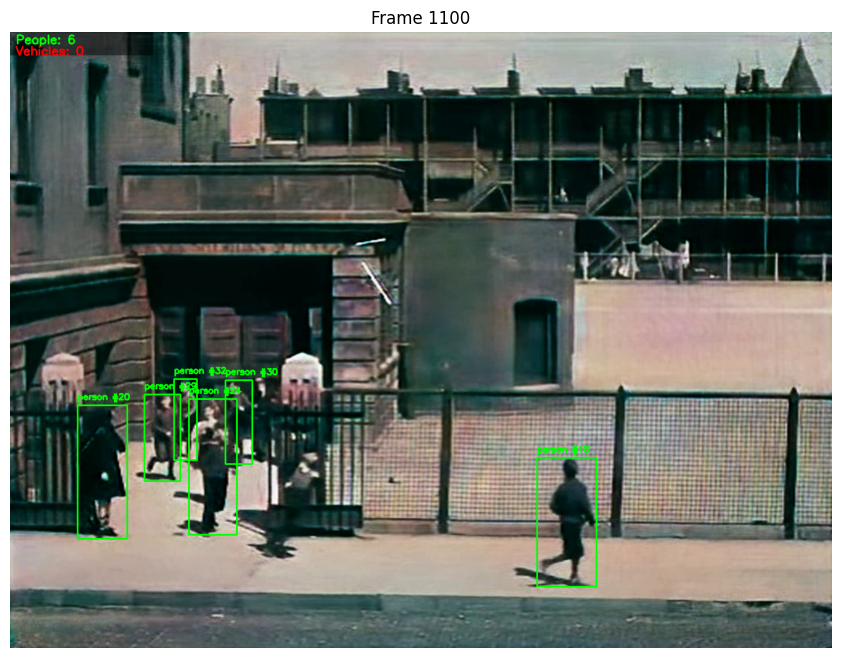

video 1/1 (frame 1101/1800) /content/restored_submission.mp4: 480x640 5 persons, 13.9ms
video 1/1 (frame 1102/1800) /content/restored_submission.mp4: 480x640 5 persons, 17.0ms
video 1/1 (frame 1103/1800) /content/restored_submission.mp4: 480x640 6 persons, 13.7ms
video 1/1 (frame 1104/1800) /content/restored_submission.mp4: 480x640 5 persons, 13.9ms
video 1/1 (frame 1105/1800) /content/restored_submission.mp4: 480x640 6 persons, 14.5ms
video 1/1 (frame 1106/1800) /content/restored_submission.mp4: 480x640 4 persons, 14.1ms
video 1/1 (frame 1107/1800) /content/restored_submission.mp4: 480x640 6 persons, 13.9ms
video 1/1 (frame 1108/1800) /content/restored_submission.mp4: 480x640 6 persons, 14.0ms
video 1/1 (frame 1109/1800) /content/restored_submission.mp4: 480x640 7 persons, 14.0ms
video 1/1 (frame 1110/1800) /content/restored_submission.mp4: 480x640 7 persons, 14.0ms
video 1/1 (frame 1111/1800) /content/restored_submission.mp4: 480x640 7 persons, 14.2ms
video 1/1 (frame 1112/1800) /con

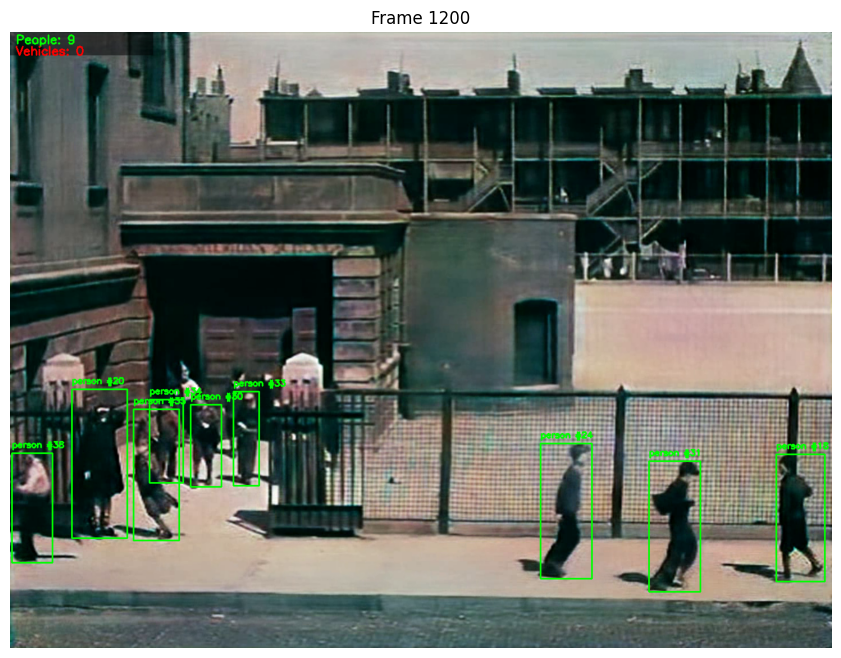

video 1/1 (frame 1201/1800) /content/restored_submission.mp4: 480x640 9 persons, 15.1ms
video 1/1 (frame 1202/1800) /content/restored_submission.mp4: 480x640 10 persons, 14.0ms
video 1/1 (frame 1203/1800) /content/restored_submission.mp4: 480x640 11 persons, 14.2ms
video 1/1 (frame 1204/1800) /content/restored_submission.mp4: 480x640 11 persons, 14.1ms
video 1/1 (frame 1205/1800) /content/restored_submission.mp4: 480x640 11 persons, 14.8ms
video 1/1 (frame 1206/1800) /content/restored_submission.mp4: 480x640 11 persons, 14.1ms
video 1/1 (frame 1207/1800) /content/restored_submission.mp4: 480x640 11 persons, 13.9ms
video 1/1 (frame 1208/1800) /content/restored_submission.mp4: 480x640 10 persons, 13.9ms
video 1/1 (frame 1209/1800) /content/restored_submission.mp4: 480x640 11 persons, 14.3ms
video 1/1 (frame 1210/1800) /content/restored_submission.mp4: 480x640 9 persons, 14.4ms
video 1/1 (frame 1211/1800) /content/restored_submission.mp4: 480x640 7 persons, 14.1ms
video 1/1 (frame 1212/18

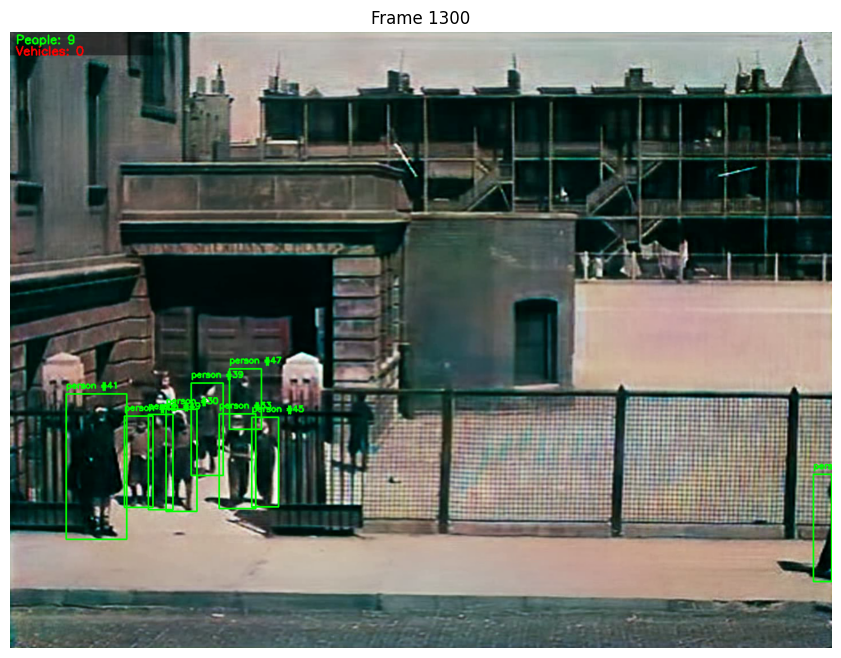

video 1/1 (frame 1301/1800) /content/restored_submission.mp4: 480x640 9 persons, 14.2ms
video 1/1 (frame 1302/1800) /content/restored_submission.mp4: 480x640 8 persons, 14.5ms
video 1/1 (frame 1303/1800) /content/restored_submission.mp4: 480x640 7 persons, 14.2ms
video 1/1 (frame 1304/1800) /content/restored_submission.mp4: 480x640 7 persons, 13.9ms
video 1/1 (frame 1305/1800) /content/restored_submission.mp4: 480x640 7 persons, 15.1ms
video 1/1 (frame 1306/1800) /content/restored_submission.mp4: 480x640 7 persons, 14.6ms
video 1/1 (frame 1307/1800) /content/restored_submission.mp4: 480x640 7 persons, 14.5ms
video 1/1 (frame 1308/1800) /content/restored_submission.mp4: 480x640 7 persons, 14.3ms
video 1/1 (frame 1309/1800) /content/restored_submission.mp4: 480x640 7 persons, 14.1ms
video 1/1 (frame 1310/1800) /content/restored_submission.mp4: 480x640 7 persons, 14.3ms
video 1/1 (frame 1311/1800) /content/restored_submission.mp4: 480x640 7 persons, 14.3ms
video 1/1 (frame 1312/1800) /con

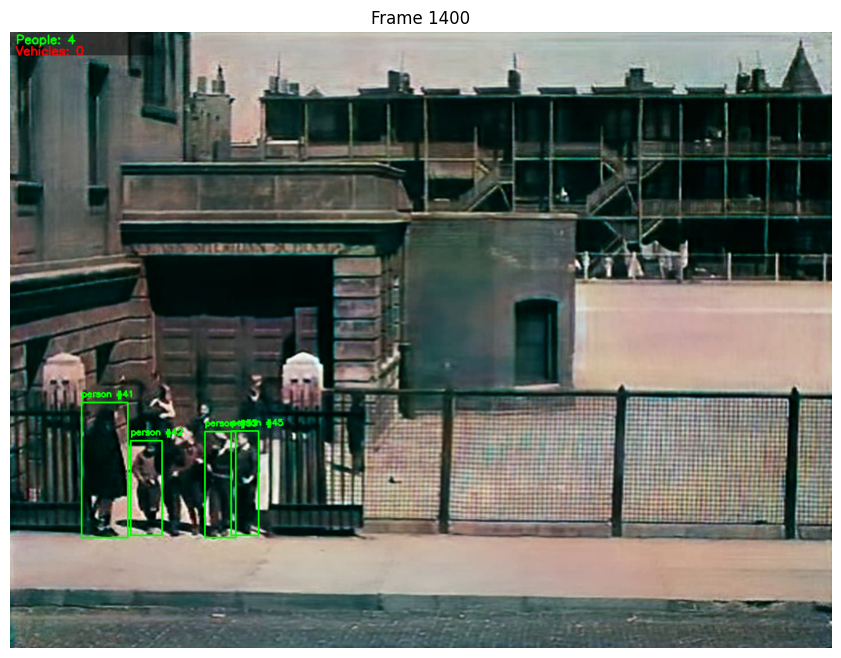

video 1/1 (frame 1401/1800) /content/restored_submission.mp4: 480x640 4 persons, 18.9ms
video 1/1 (frame 1402/1800) /content/restored_submission.mp4: 480x640 4 persons, 14.1ms
video 1/1 (frame 1403/1800) /content/restored_submission.mp4: 480x640 4 persons, 13.9ms
video 1/1 (frame 1404/1800) /content/restored_submission.mp4: 480x640 5 persons, 13.7ms
video 1/1 (frame 1405/1800) /content/restored_submission.mp4: 480x640 4 persons, 13.8ms
video 1/1 (frame 1406/1800) /content/restored_submission.mp4: 480x640 3 persons, 13.9ms
video 1/1 (frame 1407/1800) /content/restored_submission.mp4: 480x640 2 persons, 13.7ms
video 1/1 (frame 1408/1800) /content/restored_submission.mp4: 480x640 3 persons, 13.6ms
video 1/1 (frame 1409/1800) /content/restored_submission.mp4: 480x640 3 persons, 13.6ms
video 1/1 (frame 1410/1800) /content/restored_submission.mp4: 480x640 5 persons, 14.4ms
video 1/1 (frame 1411/1800) /content/restored_submission.mp4: 480x640 5 persons, 14.4ms
video 1/1 (frame 1412/1800) /con

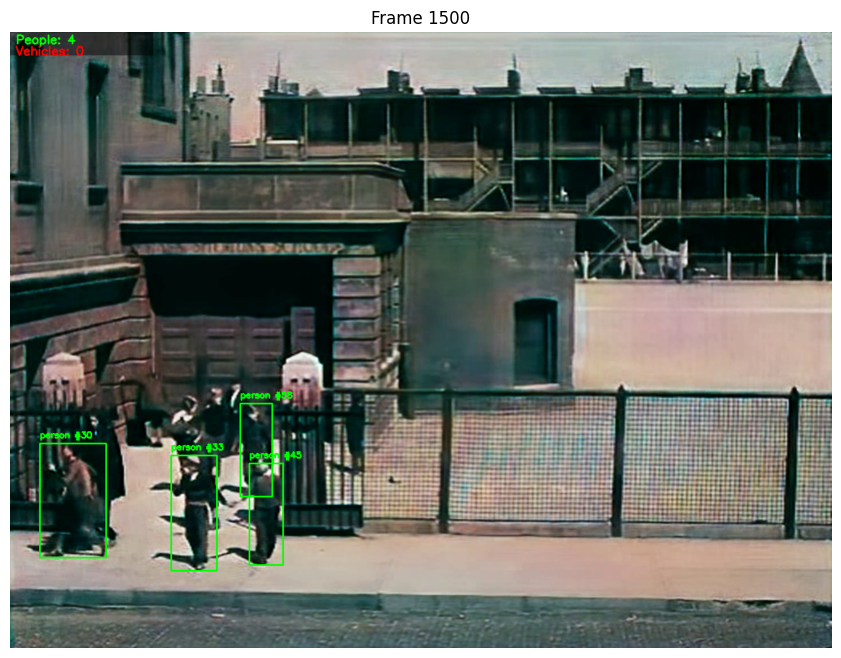

video 1/1 (frame 1501/1800) /content/restored_submission.mp4: 480x640 4 persons, 18.6ms
video 1/1 (frame 1502/1800) /content/restored_submission.mp4: 480x640 3 persons, 13.6ms
video 1/1 (frame 1503/1800) /content/restored_submission.mp4: 480x640 5 persons, 13.5ms
video 1/1 (frame 1504/1800) /content/restored_submission.mp4: 480x640 3 persons, 15.4ms
video 1/1 (frame 1505/1800) /content/restored_submission.mp4: 480x640 4 persons, 13.4ms
video 1/1 (frame 1506/1800) /content/restored_submission.mp4: 480x640 4 persons, 14.0ms
video 1/1 (frame 1507/1800) /content/restored_submission.mp4: 480x640 6 persons, 13.6ms
video 1/1 (frame 1508/1800) /content/restored_submission.mp4: 480x640 6 persons, 13.5ms
video 1/1 (frame 1509/1800) /content/restored_submission.mp4: 480x640 6 persons, 14.6ms
video 1/1 (frame 1510/1800) /content/restored_submission.mp4: 480x640 6 persons, 13.8ms
video 1/1 (frame 1511/1800) /content/restored_submission.mp4: 480x640 5 persons, 14.2ms
video 1/1 (frame 1512/1800) /con

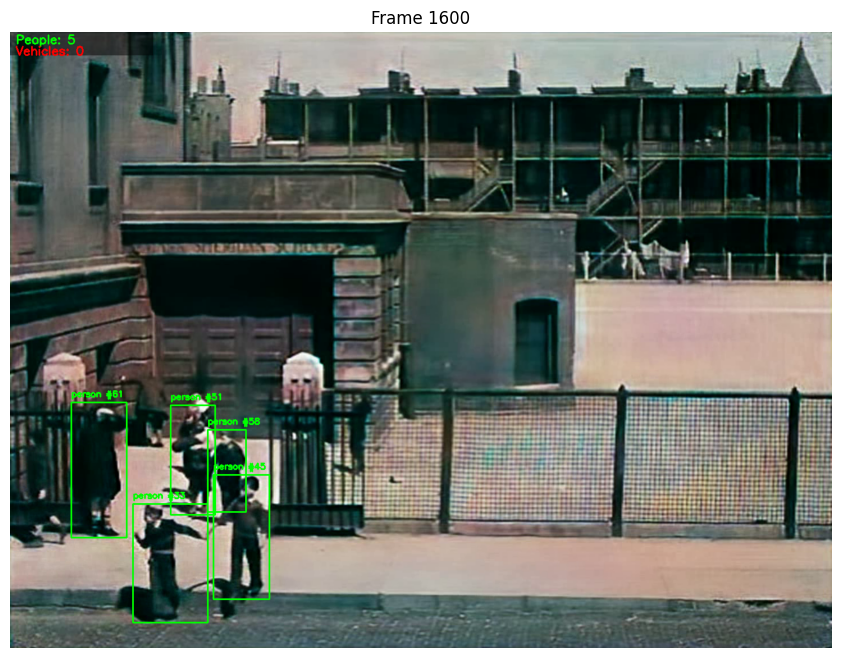

video 1/1 (frame 1601/1800) /content/restored_submission.mp4: 480x640 5 persons, 14.1ms
video 1/1 (frame 1602/1800) /content/restored_submission.mp4: 480x640 5 persons, 17.4ms
video 1/1 (frame 1603/1800) /content/restored_submission.mp4: 480x640 5 persons, 13.7ms
video 1/1 (frame 1604/1800) /content/restored_submission.mp4: 480x640 5 persons, 13.8ms
video 1/1 (frame 1605/1800) /content/restored_submission.mp4: 480x640 5 persons, 14.0ms
video 1/1 (frame 1606/1800) /content/restored_submission.mp4: 480x640 5 persons, 13.7ms
video 1/1 (frame 1607/1800) /content/restored_submission.mp4: 480x640 4 persons, 14.0ms
video 1/1 (frame 1608/1800) /content/restored_submission.mp4: 480x640 3 persons, 13.7ms
video 1/1 (frame 1609/1800) /content/restored_submission.mp4: 480x640 4 persons, 13.7ms
video 1/1 (frame 1610/1800) /content/restored_submission.mp4: 480x640 4 persons, 17.0ms
video 1/1 (frame 1611/1800) /content/restored_submission.mp4: 480x640 4 persons, 13.6ms
video 1/1 (frame 1612/1800) /con

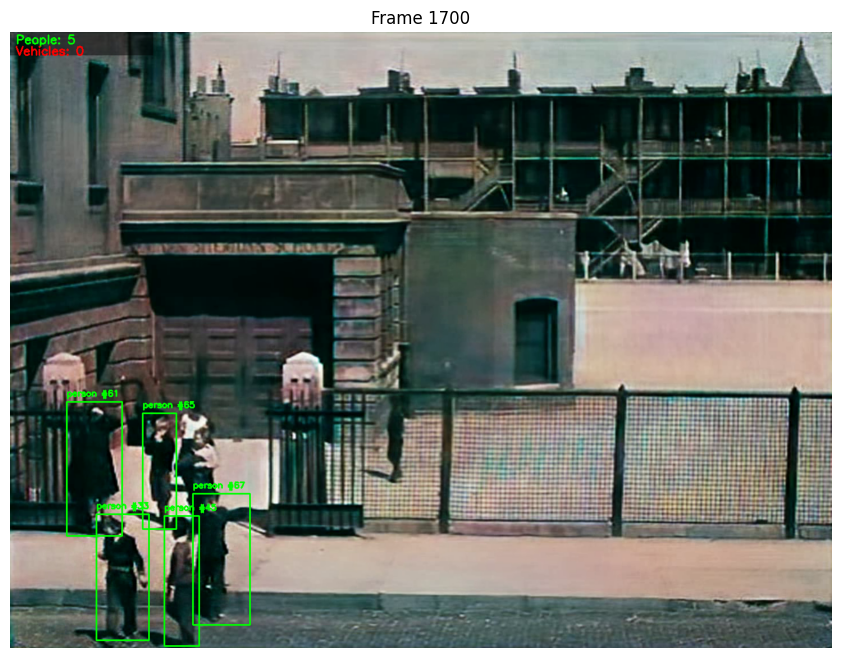

video 1/1 (frame 1701/1800) /content/restored_submission.mp4: 480x640 4 persons, 14.4ms
video 1/1 (frame 1702/1800) /content/restored_submission.mp4: 480x640 4 persons, 14.1ms
video 1/1 (frame 1703/1800) /content/restored_submission.mp4: 480x640 4 persons, 13.9ms
video 1/1 (frame 1704/1800) /content/restored_submission.mp4: 480x640 6 persons, 14.0ms
video 1/1 (frame 1705/1800) /content/restored_submission.mp4: 480x640 5 persons, 14.3ms
video 1/1 (frame 1706/1800) /content/restored_submission.mp4: 480x640 5 persons, 14.0ms
video 1/1 (frame 1707/1800) /content/restored_submission.mp4: 480x640 5 persons, 14.0ms
video 1/1 (frame 1708/1800) /content/restored_submission.mp4: 480x640 5 persons, 14.2ms
video 1/1 (frame 1709/1800) /content/restored_submission.mp4: 480x640 6 persons, 14.1ms
video 1/1 (frame 1710/1800) /content/restored_submission.mp4: 480x640 6 persons, 14.3ms
video 1/1 (frame 1711/1800) /content/restored_submission.mp4: 480x640 5 persons, 15.1ms
video 1/1 (frame 1712/1800) /con

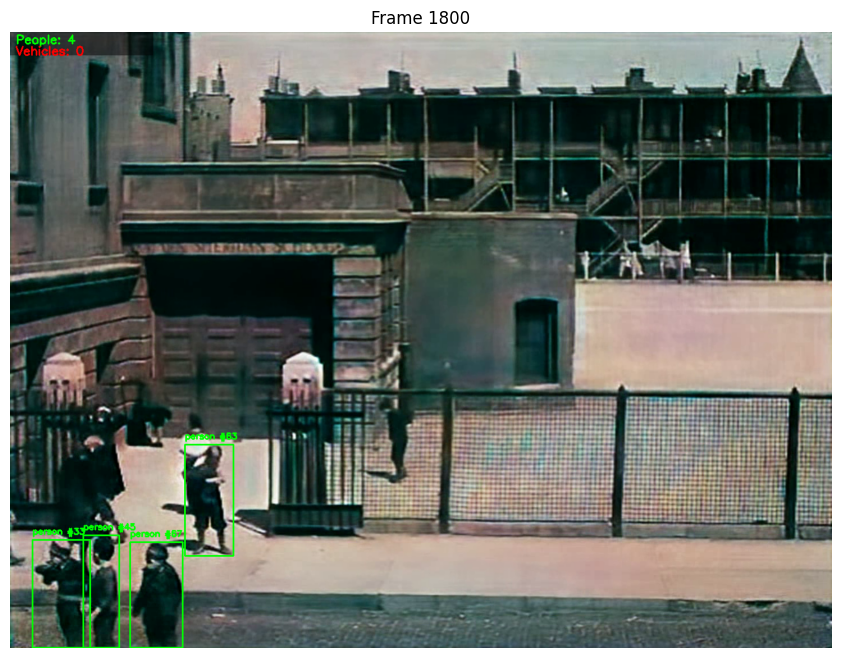

Speed: 3.1ms preprocess, 14.1ms inference, 2.7ms postprocess per image at shape (1, 3, 480, 640)
Processing complete. Output saved to output_tracked.mp4
Detected 103 unique objects

Object counts by class:
person: 69
vehicle: 34

Displaying example detections and segmentations:


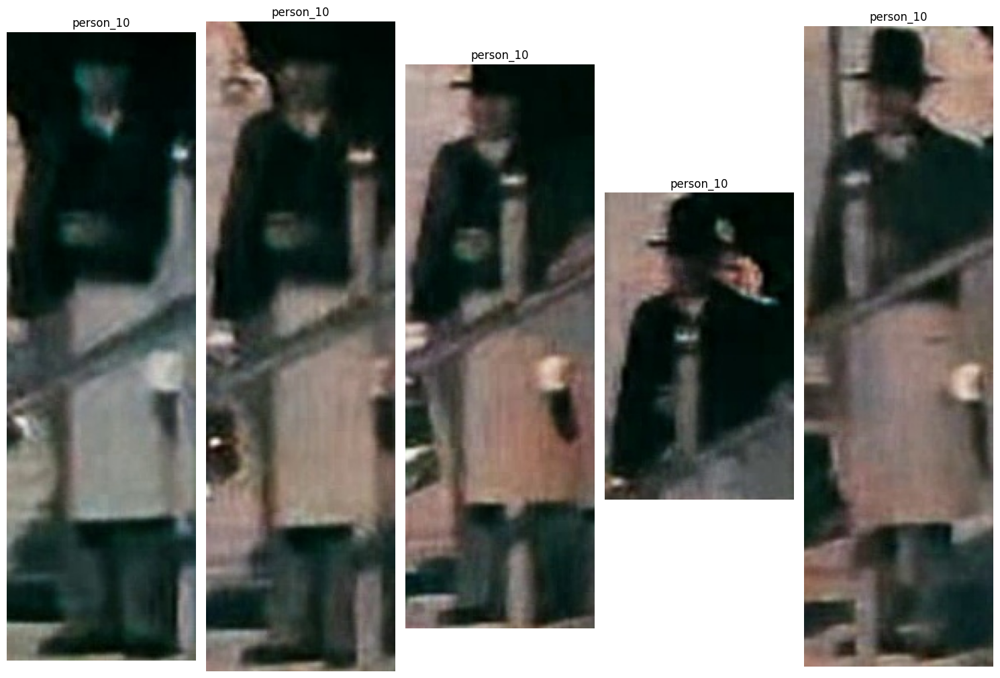

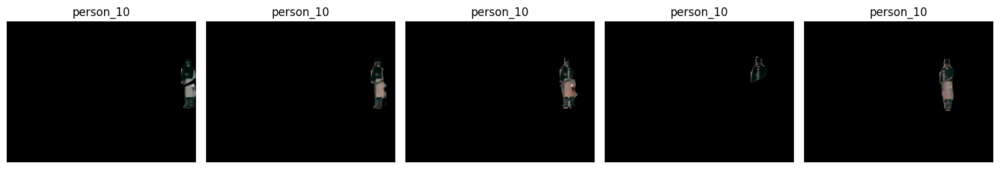

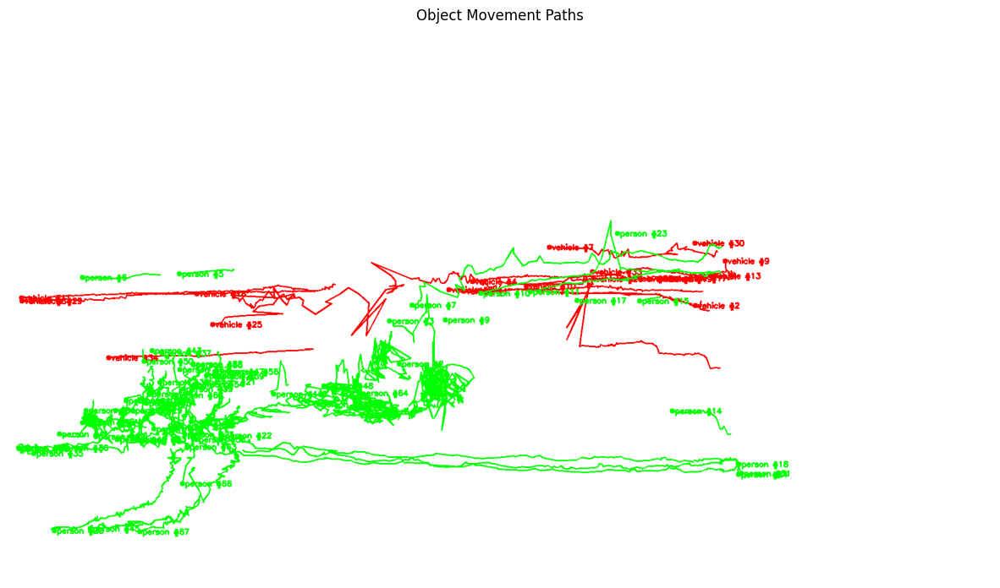


Analysis complete. Files saved:
1. output_tracked.mp4 - Video with detection and tracking visualization
2. detected_boxes/ - Directory containing cropped bounding boxes
3. segmentation_masks/ - Directory containing segmentation masks
4. tracking_metadata.json - JSON file with tracking data
5. movement_paths.jpg - Visualization of object movements


In [27]:
# Object Detection, Tracking, and Segmentation for Video Footage
# Using YOLOv8 to detect people and vehicles, track them, and generate segmentation masks

# Install required packages
!pip install ultralytics
!pip install opencv-python

import os
import cv2
import numpy as np
from ultralytics import YOLO
from google.colab import files
import matplotlib.pyplot as plt
from IPython.display import display, HTML

# Check if CUDA is available
import torch
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"CUDA device: {torch.cuda.get_device_name(0)}")

# Function to upload the video file if not already in the environment
def upload_video():
    uploaded = files.upload()
    for filename in uploaded.keys():
        print(f'Uploaded {filename}')
        return filename
    return None

# Option to use an existing file path or upload a new one
video_path = "/content/restored_submission.mp4"  # Default path
if not os.path.exists(video_path):
    print("Video file not found. Please upload your video.")
    video_path = upload_video()

# Create directories for saving results
os.makedirs("detected_boxes", exist_ok=True)
os.makedirs("segmentation_masks", exist_ok=True)

# Load a pretrained YOLOv8 model with segmentation capability
model = YOLO('yolov8x-seg.pt')  # Using the largest and most accurate segmentation model

# Original YOLO classes we're interested in
# 0: person, 2: car, 3: motorcycle, 5: bus, 7: truck
target_classes = [0, 2, 3, 5, 7]  # Will be mapped to our simplified classes

# Map for our simplified classification
class_mapping = {
    0: 'person',  # person -> person
    2: 'vehicle', # car -> vehicle
    3: 'vehicle', # motorcycle -> vehicle
    5: 'vehicle', # bus -> vehicle
    7: 'vehicle'  # truck -> vehicle
}

# ID mapping dictionaries to reassign tracker IDs to sequential numbers
id_mapping = {'person': {}, 'vehicle': {}}
next_id = {'person': 1, 'vehicle': 1}

# Process the video
def process_video(video_path):
    # Open the video file
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print("Error: Could not open video.")
        return

    # Get video properties
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = cap.get(cv2.CAP_PROP_FPS)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    print(f"Video dimensions: {width}x{height}, FPS: {fps}, Total frames: {total_frames}")

    # Set up video writer for processed output
    output_path = 'output_tracked.mp4'
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

    # Dictionary to store tracking metadata
    tracking_data = {}

    # Dictionaries to track unique objects in the current frame
    current_frame_objects = {'person': set(), 'vehicle': set()}

    frame_count = 0

    # Process video frame by frame with tracking enabled
    for result in model.track(source=video_path, show=False, stream=True, classes=target_classes, persist=True, conf=0.3, iou=0.5):
        frame = result.orig_img
        frame_count += 1

        # Check if tracking IDs are available
        if result.boxes.id is not None:
            # Get boxes, class IDs, and tracking IDs
            boxes = result.boxes.xyxy.cpu().numpy().astype(int)
            cls_ids = result.boxes.cls.cpu().numpy().astype(int)
            track_ids = result.boxes.id.cpu().numpy().astype(int)

            # Get segmentation masks if available
            if hasattr(result, 'masks') and result.masks is not None:
                masks = result.masks.xy
            else:
                masks = [None] * len(boxes)

            # Create a copy for drawing
            frame_with_boxes = frame.copy()

            # Reset current frame object counts
            current_frame_objects = {'person': set(), 'vehicle': set()}

            # Process each detection in the frame
            for box, cls_id, track_id, mask in zip(boxes, cls_ids, track_ids, masks):
                # Only process people and vehicles
                if cls_id in target_classes:
                    # Map to our simplified class (person or vehicle)
                    simple_class = class_mapping[cls_id]

                    # Map the original tracker ID to a sequential ID
                    original_id = int(track_id)
                    if original_id not in id_mapping[simple_class]:
                        id_mapping[simple_class][original_id] = next_id[simple_class]
                        next_id[simple_class] += 1

                    # Use the mapped ID instead of the original
                    mapped_id = id_mapping[simple_class][original_id]

                    x1, y1, x2, y2 = box

                    # Ensure box coordinates are within frame boundaries
                    x1, y1 = max(0, x1), max(0, y1)
                    x2, y2 = min(width, x2), min(height, y2)

                    # Create object identifier using mapped ID
                    object_id = f"{simple_class}_{mapped_id}"

                    # Add to current frame objects
                    current_frame_objects[simple_class].add(mapped_id)

                    # Extract bounding box crop
                    box_crop = frame[y1:y2, x1:x2]

                    # Create blank mask of the same size as the frame
                    seg_mask = np.zeros((height, width), dtype=np.uint8)

                    # Draw the segmentation mask if available
                    if mask is not None:
                        # Convert mask points to integer numpy array
                        mask_points = np.array(mask, dtype=np.int32)
                        cv2.fillPoly(seg_mask, [mask_points], 255)

                        # Create segmented object (apply mask to original image)
                        masked_obj = cv2.bitwise_and(frame, frame, mask=seg_mask)

                        # Save the segmentation mask
                        if frame_count % 10 == 0:  # Save every 10th frame to avoid too many files
                            mask_path = f"segmentation_masks/{object_id}_frame{frame_count}.png"
                            cv2.imwrite(mask_path, masked_obj)

                    # Save the bounding box crop
                    if frame_count % 10 == 0:  # Save every 10th frame
                        box_path = f"detected_boxes/{object_id}_frame{frame_count}.jpg"
                        if box_crop.size > 0:  # Check if crop is valid
                            cv2.imwrite(box_path, box_crop)

                    # Set color based on simplified class (green for person, red for vehicle)
                    color = (0, 255, 0) if simple_class == 'person' else (0, 0, 255)
                    cv2.rectangle(frame_with_boxes, (x1, y1), (x2, y2), color, 2)

                    # Add label with class name and sequential tracking ID
                    label = f"{simple_class} #{mapped_id}"
                    cv2.putText(frame_with_boxes, label, (x1, y1-10),
                                cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

                    # Store tracking data with sequential ID
                    if object_id not in tracking_data:
                        tracking_data[object_id] = {
                            'class': simple_class,
                            'track_id': int(mapped_id),
                            'original_id': int(original_id),
                            'frames': []
                        }

                    # Add position data for this frame
                    tracking_data[object_id]['frames'].append({
                        'frame_number': frame_count,
                        'position': [int(x1), int(y1), int(x2), int(y2)]
                    })

            # Add counter text at the top of the frame
            people_count = len(current_frame_objects['person'])
            vehicle_count = len(current_frame_objects['vehicle'])

            # Draw semi-transparent background for the counter text
            overlay = frame_with_boxes.copy()
            cv2.rectangle(overlay, (0, 0), (250, 40), (0, 0, 0), -1)
            cv2.addWeighted(overlay, 0.5, frame_with_boxes, 0.5, 0, frame_with_boxes)

            # Add counter text with color-coding
            cv2.putText(frame_with_boxes, f"People: {people_count}", (10, 20),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)
            cv2.putText(frame_with_boxes, f"Vehicles: {vehicle_count}", (10, 40),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 2)

            # Write the frame with annotations to output video
            out.write(frame_with_boxes)

            # Display progress
            if frame_count % 50 == 0:
                print(f"Processed {frame_count}/{total_frames} frames ({(frame_count/total_frames)*100:.1f}%)")

                # Display a sample frame
                if frame_count % 100 == 0:
                    plt.figure(figsize=(12, 8))
                    plt.imshow(cv2.cvtColor(frame_with_boxes, cv2.COLOR_BGR2RGB))
                    plt.title(f"Frame {frame_count}")
                    plt.axis('off')
                    plt.show()

    # Release resources
    cap.release()
    out.release()

    print(f"Processing complete. Output saved to {output_path}")
    print(f"Detected {len(tracking_data)} unique objects")

    # Display summary of detected objects
    class_counts = {}
    for obj_id, data in tracking_data.items():
        class_name = data['class']
        if class_name not in class_counts:
            class_counts[class_name] = 0
        class_counts[class_name] += 1

    print("\nObject counts by class:")
    for cls, count in class_counts.items():
        print(f"{cls}: {count}")

    # Save tracking data to file
    import json
    with open('tracking_metadata.json', 'w') as f:
        json.dump(tracking_data, f, indent=4)

    return tracking_data

# Run the processing function
tracking_results = process_video(video_path)

# Display example detections
def display_example_detections():
    # Get list of detection images
    detection_files = sorted(os.listdir("detected_boxes"))
    if not detection_files:
        print("No detection examples found.")
        return

    # Display first 5 detections
    plt.figure(figsize=(15, 10))
    valid_images = 0

    # Try to display up to 5 valid images
    for i, file in enumerate(detection_files):
        if valid_images >= 5:
            break

        img_path = os.path.join("detected_boxes", file)
        img = cv2.imread(img_path)

        # Check if image was loaded successfully
        if img is not None:
            plt.subplot(1, 5, valid_images+1)
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            plt.title(file.split('_frame')[0])
            plt.axis('off')
            valid_images += 1

    # Only show the plot if we have valid images
    if valid_images > 0:
        plt.tight_layout()
        plt.show()
    else:
        print("No valid detection images could be loaded.")

    # Display first 5 segmentation masks
    mask_files = sorted(os.listdir("segmentation_masks"))
    if mask_files:
        plt.figure(figsize=(15, 10))
        valid_masks = 0

        # Try to display up to 5 valid mask images
        for i, file in enumerate(mask_files):
            if valid_masks >= 5:
                break

            mask_path = os.path.join("segmentation_masks", file)
            mask = cv2.imread(mask_path)

            # Check if mask was loaded successfully
            if mask is not None:
                plt.subplot(1, 5, valid_masks+1)
                plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
                plt.title(file.split('_frame')[0])
                plt.axis('off')
                valid_masks += 1

        # Only show the plot if we have valid masks
        if valid_masks > 0:
            plt.tight_layout()
            plt.show()
        else:
            print("No valid segmentation mask images could be loaded.")

# Display some example detections
print("\nDisplaying example detections and segmentations:")
display_example_detections()

# When running visualization of paths, use mapped IDs
def visualize_paths():
    # Create a blank image
    canvas = np.ones((1080, 1920, 3), dtype=np.uint8) * 255  # Assuming HD resolution

    # Assign different colors to different object types - simplified to just two classes
    colors = {
        'person': (0, 255, 0),  # Green
        'vehicle': (0, 0, 255)  # Red
    }

    # Plot the paths
    for obj_id, data in tracking_results.items():
        class_name = data['class']
        color = colors.get(class_name, (0, 0, 0))

        # Extract positions
        positions = [frame_data['position'] for frame_data in data['frames']]

        # If we have more than one position, draw the path
        if len(positions) > 1:
            for i in range(len(positions) - 1):
                start_pos = ((positions[i][0] + positions[i][2]) // 2,
                             (positions[i][1] + positions[i][3]) // 2)
                end_pos = ((positions[i+1][0] + positions[i+1][2]) // 2,
                           (positions[i+1][1] + positions[i+1][3]) // 2)
                cv2.line(canvas, start_pos, end_pos, color, 2)

            # Draw a circle at the last position with the track_id
            last_pos = ((positions[-1][0] + positions[-1][2]) // 2,
                        (positions[-1][1] + positions[-1][3]) // 2)
            cv2.circle(canvas, last_pos, 5, color, -1)

            # Use the mapped ID (which is now stored in track_id)
            cv2.putText(canvas, f"{class_name} #{data['track_id']}",
                       (last_pos[0] + 5, last_pos[1] + 5),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    # Display the path visualization
    plt.figure(figsize=(15, 10))
    plt.imshow(cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB))
    plt.title("Object Movement Paths")
    plt.axis('off')
    plt.show()

    # Save the visualization
    cv2.imwrite('movement_paths.jpg', canvas)

# Generate the path visualization
visualize_paths()

print("\nAnalysis complete. Files saved:")
print("1. output_tracked.mp4 - Video with detection and tracking visualization")
print("2. detected_boxes/ - Directory containing cropped bounding boxes")
print("3. segmentation_masks/ - Directory containing segmentation masks")
print("4. tracking_metadata.json - JSON file with tracking data")
print("5. movement_paths.jpg - Visualization of object movements")